In [1]:
%matplotlib inline

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import cPickle
from sklearn.linear_model import LogisticRegression
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.metrics import accuracy_score, log_loss
import graphviz
from keras.models import Sequential
from keras.layers import Dense, Activation, Flatten, Dropout, BatchNormalization, Conv2D, MaxPooling2D

Using Theano backend.
Using cuDNN version 5103 on context None
Preallocating 10869/11441 Mb (0.950000) on cuda
Mapped name None to device cuda: Tesla K40c (0000:81:00.0)


### Helper functions

In [3]:
def loadData():
    with open('pkl_data/notes_pos.pkl','rb') as f:
        dpos = cPickle.load(f)
    with open('pkl_data/notes_neg.pkl','rb') as f:
        dneg = cPickle.load(f)
    return (dpos, dneg)

In [4]:
def concatFolds(pos, neg, scores):
    X_pos = np.concatenate([pos[score] for score in scores], axis=0)
    Y_pos = np.ones(X_pos.shape[0])
    X_neg = np.concatenate([neg[score] for score in scores], axis=0)
    Y_neg = np.zeros(X_neg.shape[0])
    X = np.concatenate((X_pos, X_neg), axis=0)
    Y = np.concatenate((Y_pos, Y_neg))
    return (X,Y)

In [5]:
def getTrainTestSplit(pos, neg, test_fold):
    all_folds = pos.keys()
    train_folds = [fold for fold in all_folds if fold != test_fold]
    (X_train, Y_train) = concatFolds(pos, neg, train_folds)
    (X_test, Y_test) = concatFolds(pos, neg, [test_fold])
    return (X_train, Y_train, X_test, Y_test)

In [6]:
def flattenImages(tensor):
    A = tensor.reshape((tensor.shape[0], -1))
    return A

In [7]:
def runCrossValidation(clf, dpos, dneg, flatten = True, pca_dims = None):
    
    labels = np.array([]) # ground truth labels
    preds = np.array([])  # predicted labels 
    probs = np.array([]) # predicted probabilities
    clfs = []
    
    for score in dpos.keys():

        # prep data
        (X_train, Y_train, X_test, Y_test) = getTrainTestSplit(dpos, dneg, score)
        if flatten:
            X_train = flattenImages(X_train)
            X_test = flattenImages(X_test)
        if pca_dims:            
            pca = PCA(n_components = pca_dims)
            pca = pca.fit(X_train)
            X_train = pca.transform(X_train)
            X_test = pca.transform(X_test)

        # fit model
        clf = clf.fit(X_train, Y_train)
        clfs.append(clf)

        # accumulate across folds
        Y_pred = clf.predict(X_test)
        Y_prob = clf.predict_proba(X_test)
        labels = np.concatenate((labels, Y_test))
        preds = np.concatenate((preds, Y_pred))
        probs = np.concatenate((probs, Y_prob[:,1]))

    # cumulative metrics
    acc = accuracy_score(labels, preds)
    logloss = log_loss(labels, probs)  
    
    return (acc, logloss, clfs)

In [8]:
def showImage(X, sz = (4,4)):
    plt.figure(figsize=sz)
    plt.imshow(1-X, cmap='gray', vmin=0, vmax=1)

### PCA Analysis

Determine number of dimensions to retain 95% of variance

In [9]:
def calcNumPCADimensions(dpos, dneg, var):
    X_pos = np.concatenate([dpos[score] for score in dpos.keys()], axis=0)
    X_neg = np.concatenate([dneg[score] for score in dpos.keys()], axis=0)
    X_all = np.concatenate((X_pos, X_neg))
    pca = PCA()
    pca = pca.fit(flattenImages(X_all))
    cumvar = pca.explained_variance_ratio_.cumsum()
    nComponents = np.where(cumvar > var)[0][0]
    return (nComponents, pca)

In [10]:
def visualizePCAComponents(comp, rows = 4, cols = 4):
    fig=plt.figure(figsize=(8, 8))
    for i in range(0, cols*rows):
        fig.add_subplot(rows, cols, i+1)
        plt.imshow(comp[i].reshape(15,15), cmap='gray')
        plt.title('Comp %d' % i)
    plt.show()

In [11]:
(dpos, dneg) = loadData()
nComponents, pca = calcNumPCADimensions(dpos, dneg, .95)
nComponents

22

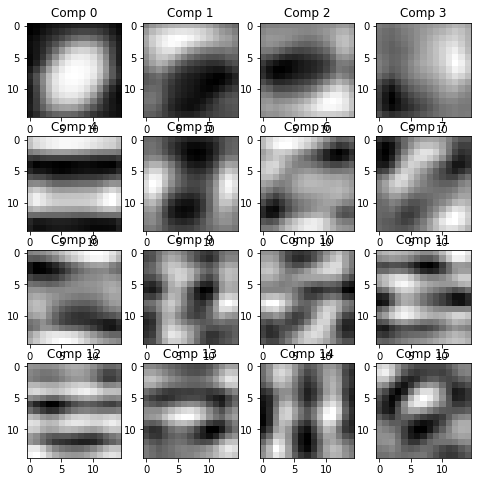

In [12]:
visualizePCAComponents(pca.components_)

### Neural Network

In [13]:
def runCrossValidation_keras(getModel_callback, dpos, dneg, nb_epoch=10, cnn=False):
    
    labels = np.array([]) # ground truth labels
    probs = np.array([]) # predicted probabilities
    models = [] 
    
    for score in sorted(dpos.keys()):

        print 'Test fold %s' % score
        (X_train, Y_train, X_test, Y_test) = getTrainTestSplit(dpos, dneg, score)
        if cnn:
            X_train = np.expand_dims(X_train, axis=3)
            X_test = np.expand_dims(X_test, axis=3)
        model = getModel_callback()
        model.fit(X_train, Y_train, nb_epoch=nb_epoch, validation_data=(X_test,Y_test))
        Y_pred = model.predict(X_test)
        labels = np.concatenate((labels, Y_test))
        probs = np.concatenate((probs, np.squeeze(Y_pred)))
        models.append(model)
        
    acc = accuracy_score(labels, np.round(probs))
    logloss = log_loss(labels, probs)  
    
    return (acc, logloss, models)

In [14]:
from keras import backend as K
def get_activations2(model, layer, X_batch):
    get_activations = K.function([model.layers[0].input, K.learning_phase()], [model.layers[layer].output,])
    activations = get_activations([X_batch,0])
    return activations

# Logistic Regression (again)

In [15]:
clf = LogisticRegression()
# (X_train, Y_train, X_test, Y_test) = getTrainTestSplit(dpos, dneg, score)
# clf.fit(X_train, Y_train)
(acc, logloss, clfs) = runCrossValidation(clf, dpos, dneg)
(acc, logloss)

(0.96073985680190932, 0.11700017028771709)

In [16]:
clfs[0]

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [17]:
from scipy.signal import convolve2d

In [18]:
#score = list(dpos.keys())[0]
for score in dpos.keys():
    (X_train, Y_train, X_test, Y_test) = getTrainTestSplit(dpos, dneg, score)

In [19]:
clf.coef_ = clf.coef_.reshape(15,15)

Visualization is above. All we did was reshape the coefficients from a trained logistic regression to be (15,15) and convolve it together with an input image, then plot the output.

In [20]:
import cv2
image = cv2.imread('true_piece.png', cv2.IMREAD_GRAYSCALE)
image.shape

(842, 595)

In [21]:
(w_width, w_height) = (15,15)
stepSize = 5

In [22]:
convolutions = []
counter = 0

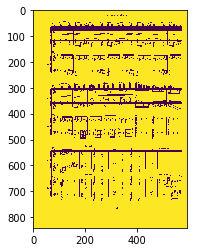

In [23]:
plt.imshow(image)

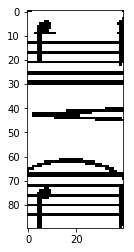

In [30]:
plt.imshow(image[50:140, 100:140], cmap='gray')

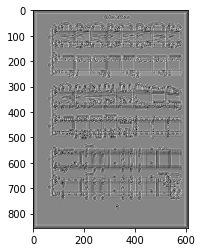

In [24]:
convolution = convolve2d(clf.coef_, image)
plt.imshow(convolution, cmap='gray')

In [74]:
A = convolution

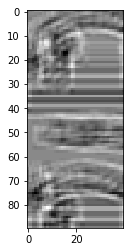

In [29]:
plt.imshow(convolution[50:140, 100:140], cmap='gray')

# LR Model, 1 Conv Layer

In [101]:
from read_activations import *

Now we'll load weights from the LR into a 1-layer CNN

In [105]:
def getModel_convLayer():
    model = Sequential([
        Conv2D(8, 15, 15, activation='relu', input_shape=(842, 595,1), name='load_LR'),
        Flatten(),
        Dense(1, activation = 'sigmoid')
    ])
    model.compile(optimizer='rmsprop',loss='binary_crossentropy',metrics=['accuracy'])
    return model

In [106]:
layerOneWeights = getModel_convLayer().layers[0].get_weights()

In [107]:
convLayer = getModel_convLayer().layers[0]

In [108]:
model = getModel_convLayer()

In [109]:
model.summary()

____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
load_LR (Convolution2D)          (None, 828, 581, 8)   1808        convolution2d_input_100[0][0]    
____________________________________________________________________________________________________
flatten_100 (Flatten)            (None, 3848544)       0           load_LR[0][0]                    
____________________________________________________________________________________________________
dense_100 (Dense)                (None, 1)             3848545     flatten_100[0][0]                
Total params: 3,850,353
Trainable params: 3,850,353
Non-trainable params: 0
____________________________________________________________________________________________________


In [110]:
layerOneWeights = getModel_convLayer().layers[0].get_weights()

In [111]:
layerOneWeights[0].shape

(15, 15, 1, 8)

In [112]:
clf.coef_ = clf.coef_.reshape(15,15)

In [113]:
clf.coef_ = np.expand_dims(clf.coef_, axis=2)

In [114]:
clf.coef_.shape

(15, 15, 1)

In [115]:
weights = layerOneWeights[0]

In [116]:
for filter_ in range(weights.shape[-1]):
    weights[:,:,:,filter_] = clf.coef_

In [117]:
weightList = []

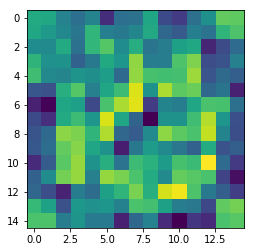

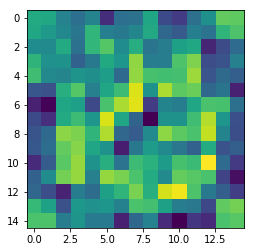

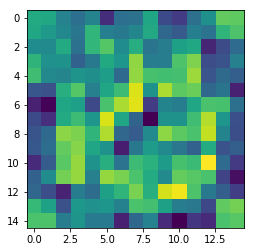

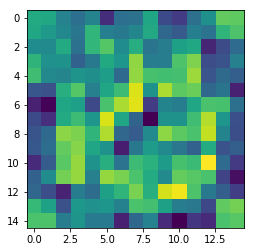

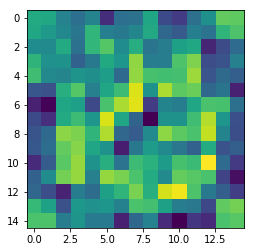

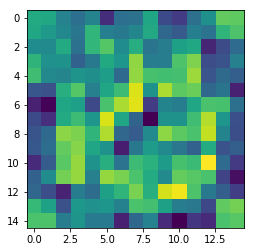

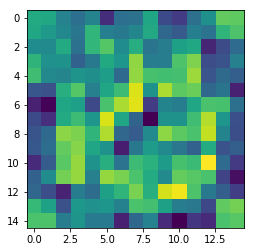

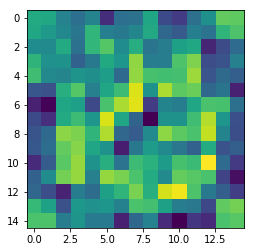

In [118]:
for filter_id in range(weights.shape[-1]):
    new_weight = weights[:,:,:,filter_id].reshape(15,15)
    weightList.append(new_weight)
    plt.imshow(new_weight)
    plt.show()

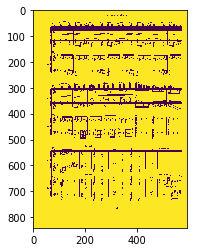

In [119]:
plt.imshow(image)

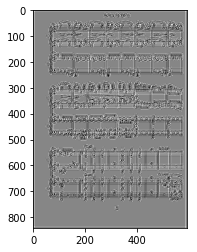

In [120]:
filter1_convolution = convolve2d(image, weightList[0], mode="same")
plt.imshow(filter1_convolution, cmap="gray")

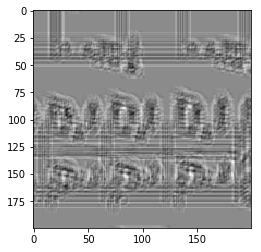

In [121]:
plt.imshow(filter1_convolution[200:400,200:400], cmap='gray')

In [122]:
img = image

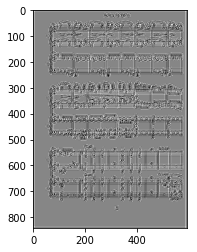

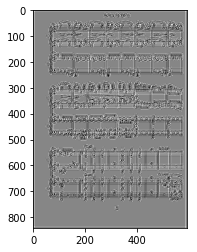

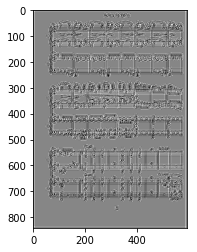

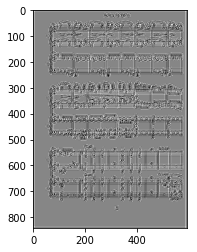

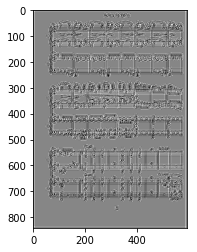

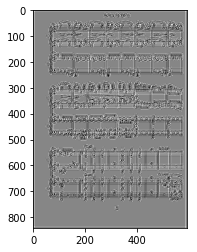

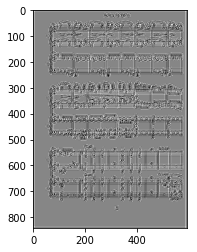

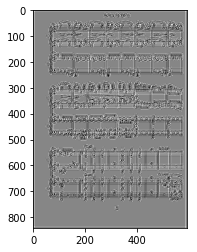

In [123]:
for i in range(len(weightList)):
    temp = 0
    temp = convolve2d(img, weightList[i], mode="same")
    plt.imshow(temp, cmap='gray')
    plt.show()

# 1-Layer CNN

In [87]:
def getModel_convLayer():
    model = Sequential([
        Conv2D(8, 3, 3, activation='relu', input_shape=(15, 15,1)),
        Flatten(),
        Dense(1, activation = 'sigmoid')
    ])
    model.compile(optimizer='rmsprop',loss='binary_crossentropy',metrics=['accuracy'])
    return model

In [88]:
model = getModel_convLayer

In [89]:
(acc, logloss, models) = runCrossValidation_keras(model, dpos, dneg, nb_epoch=5, cnn=True)

Test fold score1
Train on 8100 samples, validate on 280 samples
Epoch 1/5
8100/8100 [==============================] - 0s - loss: 0.2075 - acc: 0.9189 - val_loss: 0.1413 - val_acc: 0.9643
Epoch 2/5
8100/8100 [==============================] - 0s - loss: 0.1128 - acc: 0.9590 - val_loss: 0.1417 - val_acc: 0.9643
Epoch 3/5
8100/8100 [==============================] - 0s - loss: 0.1043 - acc: 0.9636 - val_loss: 0.2403 - val_acc: 0.8893
Epoch 4/5
8100/8100 [==============================] - 0s - loss: 0.1001 - acc: 0.9640 - val_loss: 0.1471 - val_acc: 0.9643
Epoch 5/5
8100/8100 [==============================] - 0s - loss: 0.0960 - acc: 0.9658 - val_loss: 0.1613 - val_acc: 0.9500
Test fold score10
Train on 8062 samples, validate on 318 samples
Epoch 1/5
8062/8062 [==============================] - 0s - loss: 0.2146 - acc: 0.9171 - val_loss: 0.1213 - val_acc: 0.9654
Epoch 2/5
8062/8062 [==============================] - 0s - loss: 0.1219 - acc: 0.9563 - val_loss: 0.0966 - val_acc: 0.9717
Epo

8048/8048 [==============================] - 0s - loss: 0.1078 - acc: 0.9625 - val_loss: 0.0487 - val_acc: 0.9849
Epoch 5/5
8048/8048 [==============================] - 0s - loss: 0.1053 - acc: 0.9640 - val_loss: 0.0605 - val_acc: 0.9759
Test fold score4
Train on 8174 samples, validate on 206 samples
Epoch 1/5
8174/8174 [==============================] - 0s - loss: 0.2374 - acc: 0.9005 - val_loss: 0.0595 - val_acc: 0.9806
Epoch 2/5
8174/8174 [==============================] - 0s - loss: 0.1217 - acc: 0.9582 - val_loss: 0.0584 - val_acc: 0.9660
Epoch 3/5
8174/8174 [==============================] - 0s - loss: 0.1131 - acc: 0.9602 - val_loss: 0.0713 - val_acc: 0.9612
Epoch 4/5
8174/8174 [==============================] - 0s - loss: 0.1079 - acc: 0.9610 - val_loss: 0.0502 - val_acc: 0.9709
Epoch 5/5
8174/8174 [==============================] - 0s - loss: 0.1075 - acc: 0.9616 - val_loss: 0.0325 - val_acc: 0.9854
Test fold score5
Train on 8044 samples, validate on 336 samples
Epoch 1/5
8044

In [90]:
getModel_convLayer().summary()

____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
convolution2d_195 (Convolution2D (None, 13, 13, 8)     80          convolution2d_input_96[0][0]     
____________________________________________________________________________________________________
flatten_96 (Flatten)             (None, 1352)          0           convolution2d_195[0][0]          
____________________________________________________________________________________________________
dense_96 (Dense)                 (None, 1)             1353        flatten_96[0][0]                 
Total params: 1,433
Trainable params: 1,433
Non-trainable params: 0
____________________________________________________________________________________________________


In [91]:
models[0].save('modelTest1.h5')

In [92]:
layerOneWeights = getModel_convLayer().layers[0].get_weights()

In [93]:
weights = layerOneWeights[0]

In [94]:
weightList = []

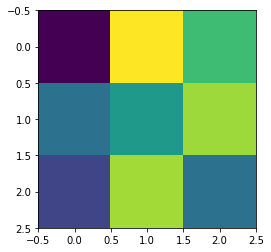

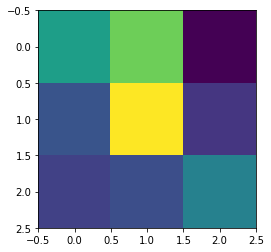

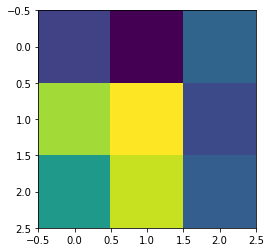

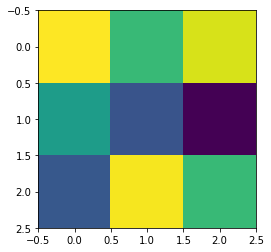

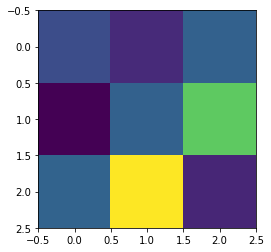

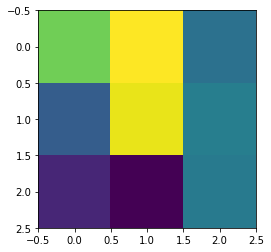

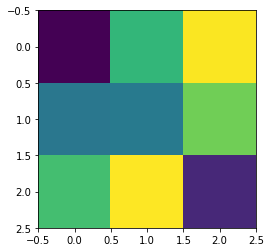

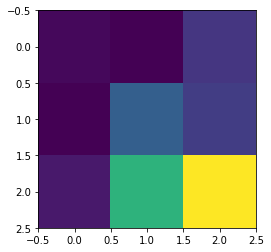

In [95]:
for filter_id in range(weights.shape[-1]):
    new_weight = weights[:,:,:,filter_id].reshape(3,3)
    weightList.append(new_weight)
    plt.imshow(new_weight)
    plt.show()

Below, we plot the convolution of the first filter with the image.

In [96]:
from scipy.signal import convolve2d

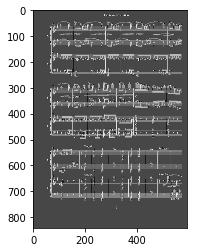

In [98]:
filter1_convolution = convolve2d(image, weightList[0], mode="same")
plt.imshow(filter1_convolution, cmap="gray")

In [99]:
img = image

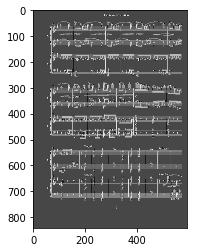

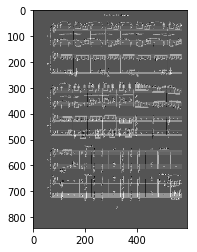

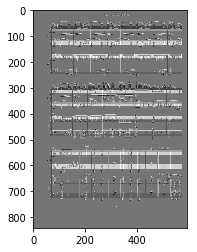

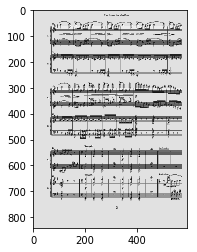

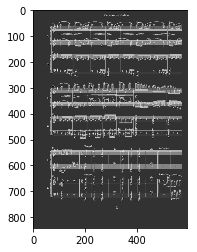

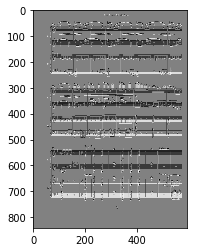

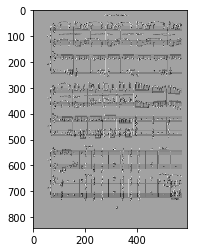

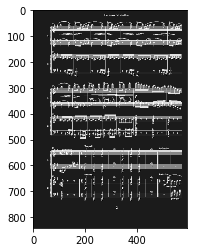

In [100]:
for i in range(len(weightList)):
    temp = 0
    temp = convolve2d(img, weightList[i], mode="same")
    plt.imshow(temp, cmap="gray")
    plt.show()

Above is (allegedly) the image after all 8 of the filters from the conv2d layer have been applied.

# More complicated CNN

In [126]:
def getModel_twoConvLayer():
    model = Sequential([
        Conv2D(8, 3, 3, activation='relu', input_shape=(15, 15,1)),
        MaxPooling2D(pool_size=(2,2)),
        Conv2D(8, 3, 3, activation='relu'),
        Flatten(),
        Dense(1, activation = 'sigmoid')
    ])
    model.compile(optimizer='rmsprop',loss='binary_crossentropy',metrics=['accuracy'])
    return model

In [127]:
newModel = getModel_twoConvLayer

In [128]:
(acc, logloss, models) = runCrossValidation_keras(newModel, dpos, dneg, nb_epoch=5, cnn=True)

Test fold score1
Train on 8100 samples, validate on 280 samples
Epoch 1/5
8100/8100 [==============================] - 0s - loss: 0.2626 - acc: 0.9251 - val_loss: 0.1291 - val_acc: 0.9643
Epoch 2/5
8100/8100 [==============================] - 0s - loss: 0.1352 - acc: 0.9500 - val_loss: 0.1754 - val_acc: 0.9571
Epoch 3/5
8100/8100 [==============================] - 0s - loss: 0.1182 - acc: 0.9575 - val_loss: 0.1569 - val_acc: 0.9607
Epoch 4/5
8100/8100 [==============================] - 0s - loss: 0.1094 - acc: 0.9622 - val_loss: 0.1410 - val_acc: 0.9607
Epoch 5/5
8100/8100 [==============================] - 0s - loss: 0.1019 - acc: 0.9641 - val_loss: 0.1421 - val_acc: 0.9607
Test fold score10
Train on 8062 samples, validate on 318 samples
Epoch 1/5
8062/8062 [==============================] - 0s - loss: 0.2728 - acc: 0.8951 - val_loss: 0.1330 - val_acc: 0.9528
Epoch 2/5
8062/8062 [==============================] - 0s - loss: 0.1402 - acc: 0.9453 - val_loss: 0.1032 - val_acc: 0.9686
Epo

8048/8048 [==============================] - 0s - loss: 0.1182 - acc: 0.9584 - val_loss: 0.0706 - val_acc: 0.9789
Epoch 5/5
8048/8048 [==============================] - 0s - loss: 0.1121 - acc: 0.9616 - val_loss: 0.0847 - val_acc: 0.9759
Test fold score4
Train on 8174 samples, validate on 206 samples
Epoch 1/5
8174/8174 [==============================] - 0s - loss: 0.2730 - acc: 0.8887 - val_loss: 0.1265 - val_acc: 0.9563
Epoch 2/5
8174/8174 [==============================] - 0s - loss: 0.1463 - acc: 0.9418 - val_loss: 0.0919 - val_acc: 0.9709
Epoch 3/5
8174/8174 [==============================] - 0s - loss: 0.1269 - acc: 0.9529 - val_loss: 0.0804 - val_acc: 0.9709
Epoch 4/5
8174/8174 [==============================] - 0s - loss: 0.1175 - acc: 0.9578 - val_loss: 0.0835 - val_acc: 0.9709
Epoch 5/5
8174/8174 [==============================] - 0s - loss: 0.1118 - acc: 0.9590 - val_loss: 0.0609 - val_acc: 0.9806
Test fold score5
Train on 8044 samples, validate on 336 samples
Epoch 1/5
8044

In [129]:
getModel_twoConvLayer().summary()

____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
convolution2d_257 (Convolution2D (None, 13, 13, 8)     80          convolution2d_input_132[0][0]    
____________________________________________________________________________________________________
maxpooling2d_97 (MaxPooling2D)   (None, 6, 6, 8)       0           convolution2d_257[0][0]          
____________________________________________________________________________________________________
convolution2d_258 (Convolution2D (None, 4, 4, 8)       584         maxpooling2d_97[0][0]            
____________________________________________________________________________________________________
flatten_132 (Flatten)            (None, 128)           0           convolution2d_258[0][0]          
___________________________________________________________________________________________

In [130]:
models[0].save('models/modelTest2.h5')

In [131]:
layerOneWeights = getModel_twoConvLayer().layers[0].get_weights()

In [132]:
weights = layerOneWeights[0]

In [133]:
weightList = []

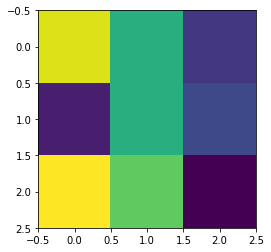

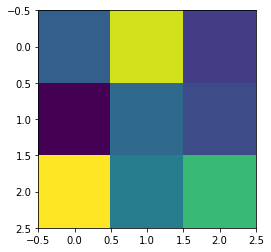

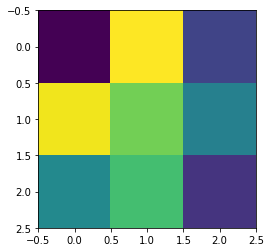

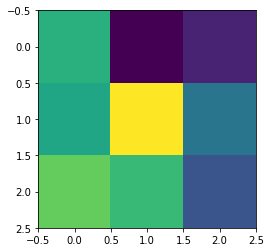

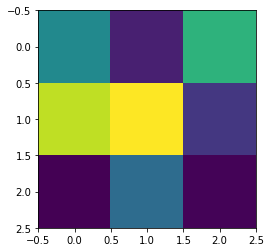

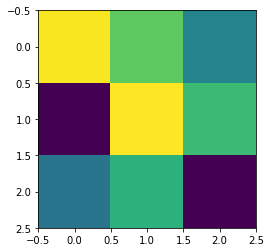

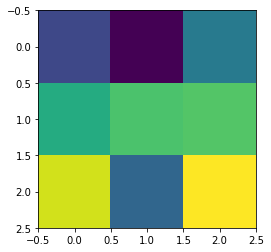

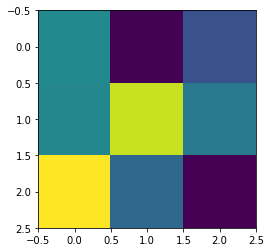

In [134]:
for filter_id in range(weights.shape[-1]):
    new_weight = weights[:,:,:,filter_id].reshape(3,3)
    weightList.append(new_weight)
    plt.imshow(new_weight)
    plt.show()

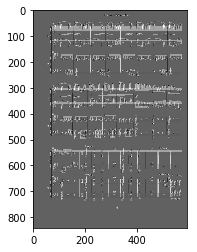

In [135]:
filter1_convolution = convolve2d(image, weightList[0], mode="same")
plt.imshow(filter1_convolution, cmap="gray")

In [136]:
img2 = image

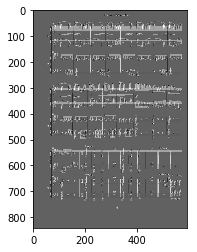

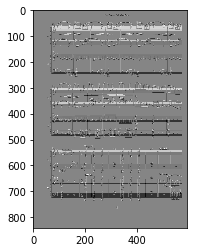

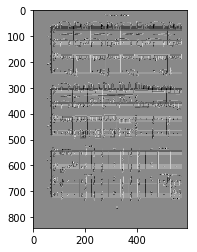

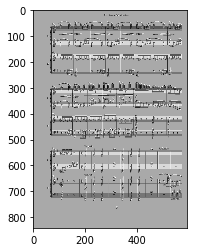

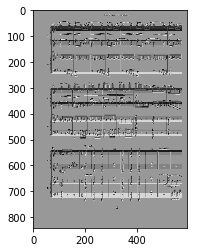

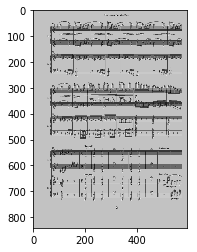

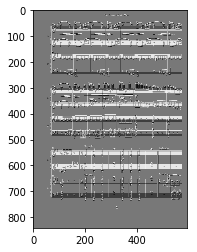

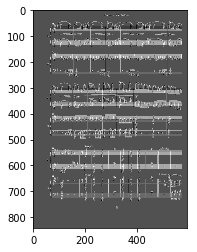

In [137]:
for i in range(len(weightList)):
    temp = 0
    temp = convolve2d(img2, weightList[i], mode="same")
    plt.imshow(temp, cmap='gray')
    plt.show()

Now for the second conv layer

In [138]:
convLayerTwoWeights = getModel_twoConvLayer().layers[2].get_weights()

In [144]:
convWeights = convLayerTwoWeights[0]

In [140]:
weightListTwo = []

We reshape to (3,3,1,64) and apply to original image since the 64 is now the combinations of applying a layer 1 filter to original image, then a layer 2 filter to that output (8 filters x 8 filters = 64)

In [145]:
convWeights.shape

(3, 3, 8, 8)

In [146]:
convWeights = convWeights.reshape(3,3,1,64)

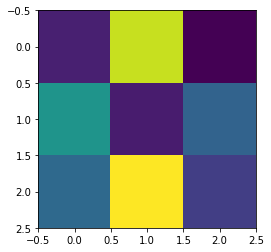

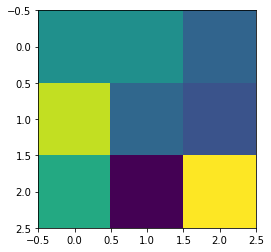

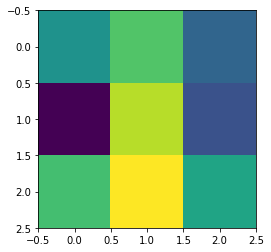

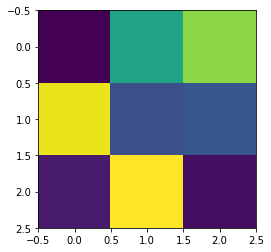

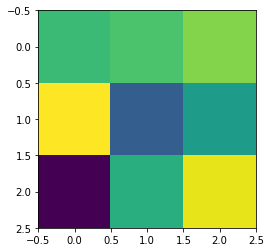

...

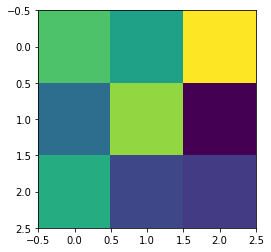

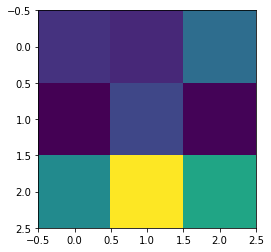

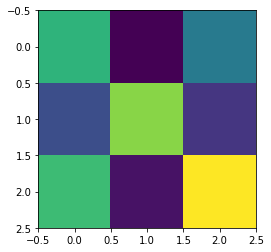

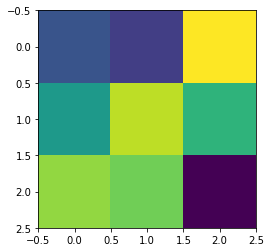

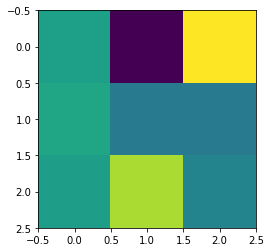

In [147]:
for filter_id in range(convWeights.shape[-1]):
    new_weight = convWeights[:,:,:,filter_id].reshape(3,3)
    weightListTwo.append(new_weight)
    plt.imshow(new_weight)
    plt.show()

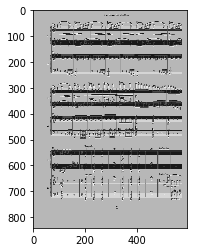

In [82]:
filter1_convolution = convolve2d(image, weightListTwo[0], mode="same")
plt.imshow(filter1_convolution, cmap="gray")

In [83]:
img3 = image

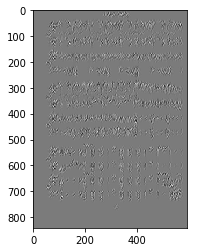

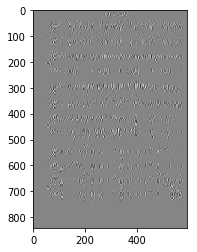

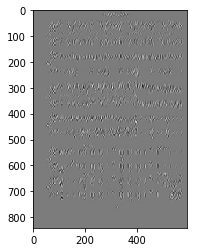

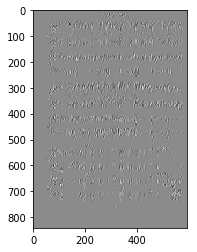

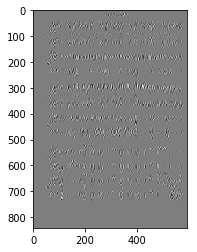

...

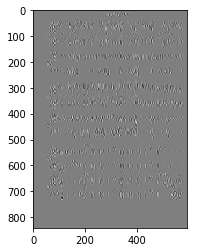

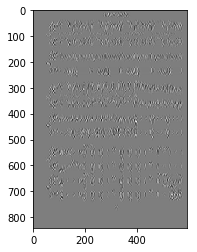

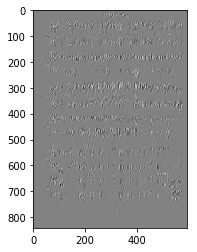

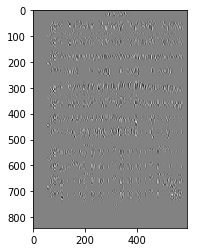

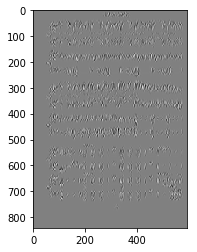

In [149]:
for i in range(len(weightListTwo)):
    temp = 0
    temp = convolve2d(img3, weightListTwo[i], mode="same")
    plt.imshow(temp, cmap='gray')
    plt.show()

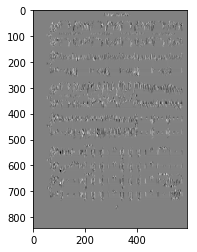

In [85]:
plt.imshow(img2, cmap="gray")

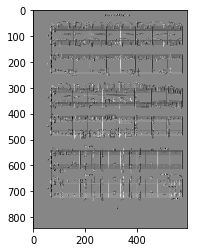

In [150]:
oneConv = convolve2d(filter1_convolution, weightListTwo[0], mode="same")
plt.imshow(oneConv, cmap="gray")

# Three Layers

In [19]:
def getModel_threeConvLayer():
    model = Sequential([
        Conv2D(8, 3, 3, activation='relu', input_shape=(15, 15,1)),
        Conv2D(8, 3, 3, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Conv2D(16, 3, 3, activation='relu'),
        Flatten(),
        Dense(1, activation = 'sigmoid')
    ])
    model.compile(optimizer='rmsprop',loss='binary_crossentropy',metrics=['accuracy'])
    return model

In [20]:
modelThree = getModel_threeConvLayer

In [21]:
(acc, logloss, models) = runCrossValidation_keras(modelThree, dpos, dneg, nb_epoch=5, cnn=True)

Test fold score1
Train on 8100 samples, validate on 280 samples
Epoch 1/5
8100/8100 [==============================] - 0s - loss: 0.2116 - acc: 0.9172 - val_loss: 0.4216 - val_acc: 0.7429
Epoch 2/5
8100/8100 [==============================] - 0s - loss: 0.1210 - acc: 0.9562 - val_loss: 0.1069 - val_acc: 0.9714
Epoch 3/5
8100/8100 [==============================] - 0s - loss: 0.1050 - acc: 0.9644 - val_loss: 0.1215 - val_acc: 0.9714
Epoch 4/5
8100/8100 [==============================] - 0s - loss: 0.0934 - acc: 0.9674 - val_loss: 0.1105 - val_acc: 0.9679
Epoch 5/5
8100/8100 [==============================] - 0s - loss: 0.0886 - acc: 0.9689 - val_loss: 0.1209 - val_acc: 0.9679
Test fold score10
Train on 8062 samples, validate on 318 samples
Epoch 1/5
8062/8062 [==============================] - 0s - loss: 0.2293 - acc: 0.9054 - val_loss: 0.1268 - val_acc: 0.9686
Epoch 2/5
8062/8062 [==============================] - 0s - loss: 0.1382 - acc: 0.9501 - val_loss: 0.1165 - val_acc: 0.9654
Epo

8048/8048 [==============================] - 0s - loss: 0.0964 - acc: 0.9674 - val_loss: 0.0558 - val_acc: 0.9789
Epoch 5/5
8048/8048 [==============================] - 0s - loss: 0.0905 - acc: 0.9697 - val_loss: 0.0553 - val_acc: 0.9819
Test fold score4
Train on 8174 samples, validate on 206 samples
Epoch 1/5
8174/8174 [==============================] - 0s - loss: 0.2475 - acc: 0.8975 - val_loss: 0.1334 - val_acc: 0.9417
Epoch 2/5
8174/8174 [==============================] - 0s - loss: 0.1339 - acc: 0.9533 - val_loss: 0.0994 - val_acc: 0.9515
Epoch 3/5
8174/8174 [==============================] - 0s - loss: 0.1143 - acc: 0.9605 - val_loss: 0.0742 - val_acc: 0.9709
Epoch 4/5
8174/8174 [==============================] - 0s - loss: 0.1064 - acc: 0.9634 - val_loss: 0.0554 - val_acc: 0.9757
Epoch 5/5
8174/8174 [==============================] - 0s - loss: 0.1006 - acc: 0.9657 - val_loss: 0.0397 - val_acc: 0.9854
Test fold score5
Train on 8044 samples, validate on 336 samples
Epoch 1/5
8044

In [22]:
models[0].save('models/threeLayerModel.h5')

In [23]:
layerOneWeights = getModel_threeConvLayer().layers[0].get_weights()

In [24]:
weights = layerOneWeights[0]

In [25]:
weightList = []

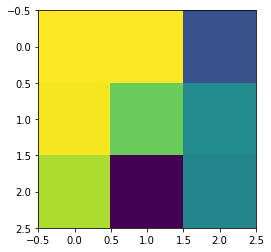

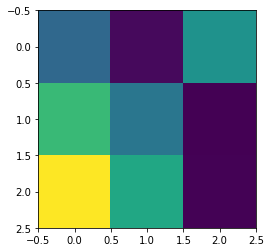

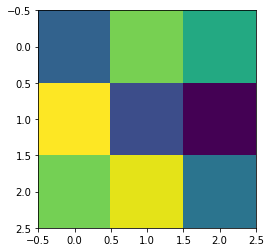

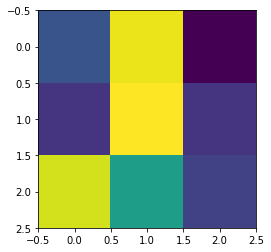

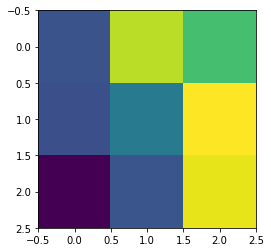

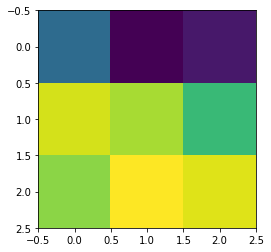

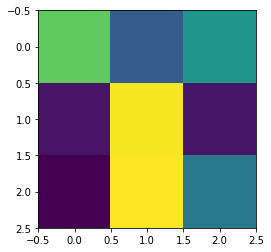

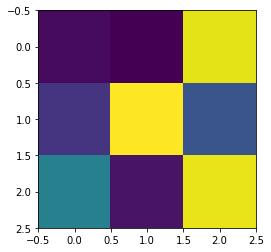

In [26]:
for filter_id in range(weights.shape[-1]):
    new_weight = weights[:,:,:,filter_id].reshape(3,3)
    weightList.append(new_weight)
    plt.imshow(new_weight)
    plt.show()

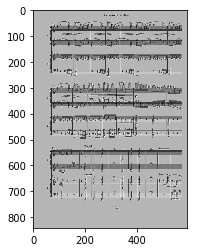

In [31]:
filter1_convolution = convolve2d(image, weightList[0], mode="same")
plt.imshow(filter1_convolution, cmap="gray")

Now we'll apply all the filter of the second conv layer to the ouptut of the first filter from first conv layer.

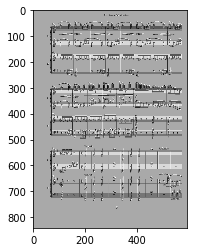

In [152]:
filter4_convolution = convolve2d(image, weightList[3], mode="same")
plt.imshow(filter4_convolution, cmap="gray")

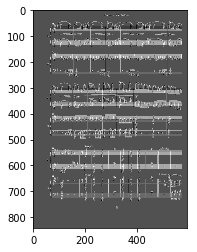

In [153]:
filter8_convolution = convolve2d(image, weightList[7], mode="same")
plt.imshow(filter8_convolution, cmap="gray")

In [154]:
convLayerTwoWeights = getModel_threeConvLayer().layers[1].get_weights()

In [155]:
convWeights = convLayerTwoWeights[0]

In [156]:
convWeights.shape

(3, 3, 8, 8)

In [157]:
convWeights = convWeights.reshape(3,3,1,64)

In [158]:
weightListTwo = []

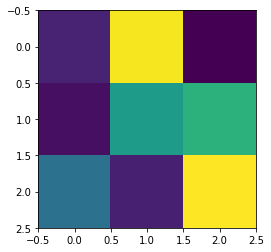

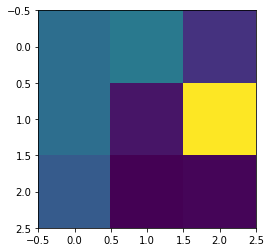

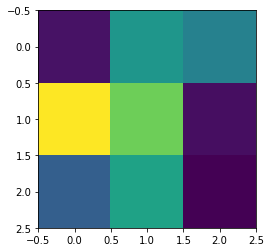

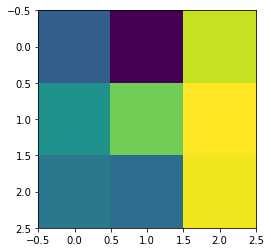

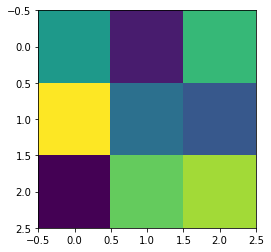

...

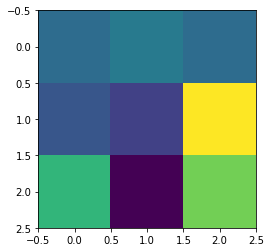

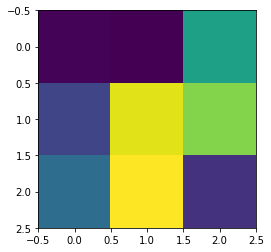

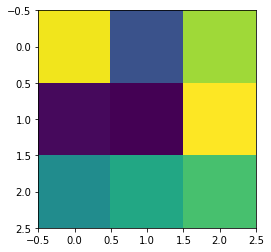

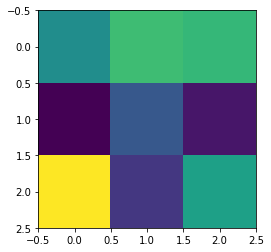

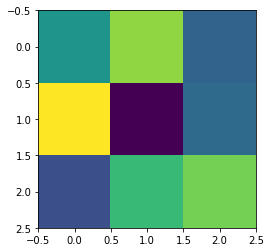

In [159]:
for filter_id in range(convWeights.shape[-1]):
    new_weight = convWeights[:,:,:,filter_id].reshape(3,3)
    weightListTwo.append(new_weight)
    plt.imshow(new_weight)
    plt.show()

In [169]:
img3 = image

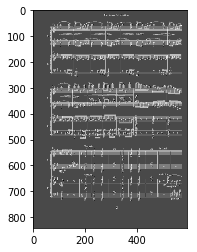

In [170]:
conv2_img = convolve2d(img3, weightListTwo[0], mode="same")
plt.imshow(conv2_img, cmap='gray')

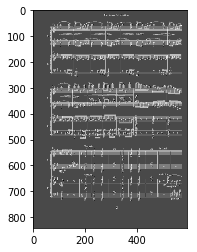

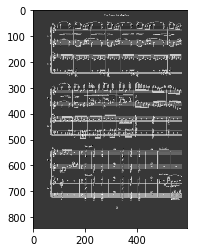

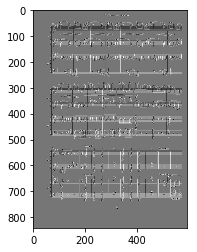

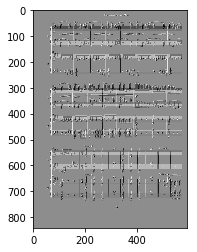

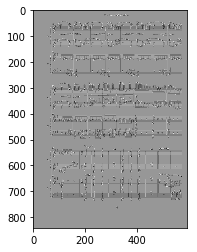

...

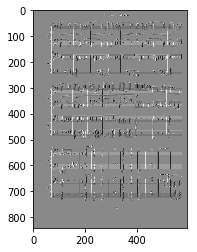

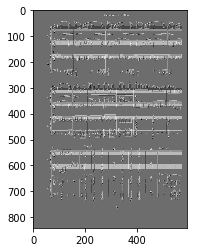

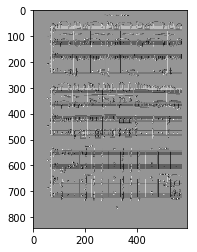

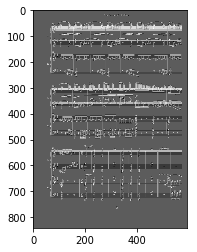

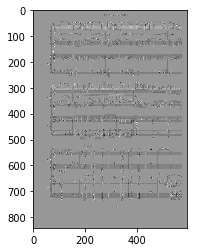

In [171]:
for i in range(len(weightListTwo)):
    temp = 0
    temp = convolve2d(img3, weightListTwo[i], mode="same")
    plt.imshow(temp, cmap='gray')
    plt.show()

In [162]:
convLayerThreeWeights = getModel_threeConvLayer().layers[3].get_weights()

In [163]:
convWeights3 = convLayerThreeWeights[0]

In [164]:
convWeights3.shape

(3, 3, 8, 16)

In [167]:
convWeights3 = convWeights3.reshape(3,3,1,128)

In [165]:
weightListThree = []

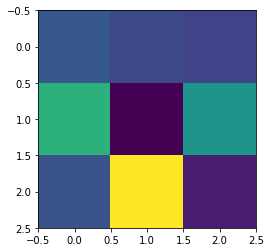

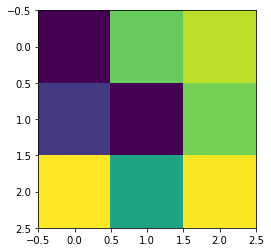

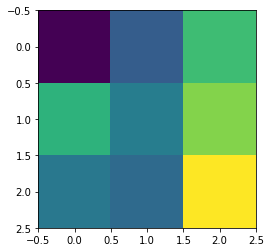

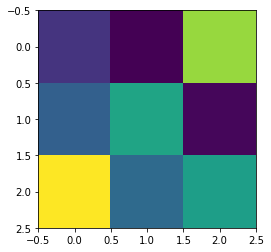

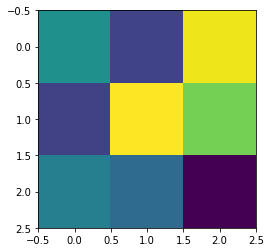

...

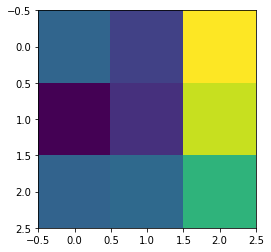

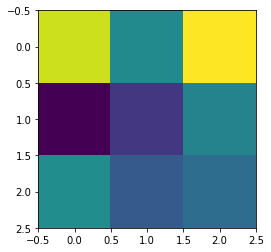

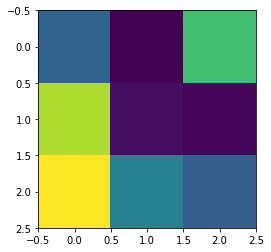

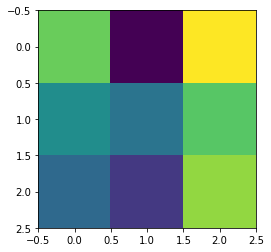

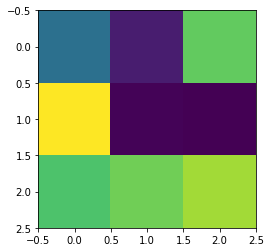

In [168]:
for filter_id in range(convWeights3.shape[-1]):
    new_weight = convWeights3[:,:,:,filter_id].reshape(3,3)
    weightListThree.append(new_weight)
    plt.imshow(new_weight)
    plt.show()

In [172]:
imgThree = image

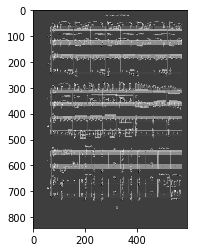

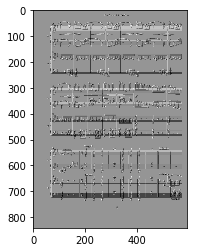

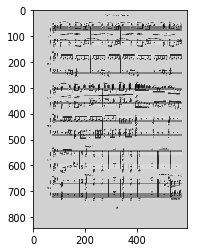

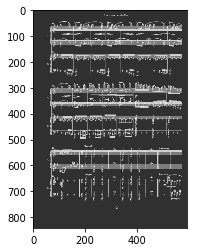

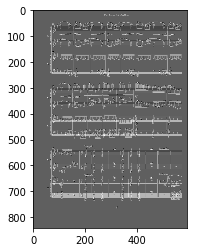

...

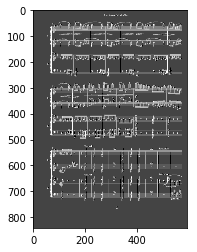

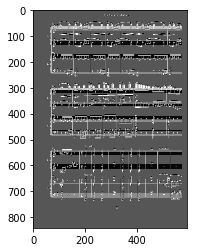

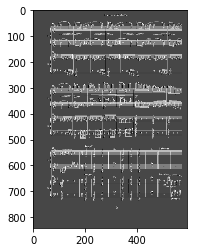

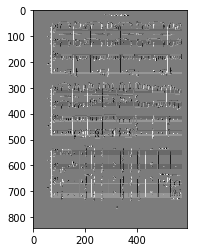

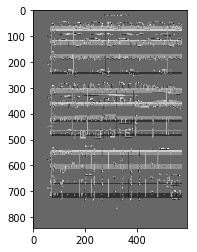

In [173]:
for i in range(len(weightListThree)):
    temp = 0
    temp = convolve2d(imgThree, weightListThree[i], mode="same")
    plt.imshow(temp, cmap='gray')
    plt.show()

# Full Network

In [174]:
def getModel_convcommon2():
    model = Sequential([
        BatchNormalization(input_shape=(15, 15, 1)),
        Conv2D(8, 3, 3, activation='relu', name='conv_one'),
        Conv2D(8, 3, 3, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Conv2D(8, 1, 1, activation='relu'),
        Conv2D(8, 1, 1, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Conv2D(8, 1, 1, activation='relu'),
        Conv2D(8, 1, 1, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Flatten(),
        Dense(225, activation = 'relu'),
        Dense(225, activation = 'relu'),
        Dense(1, activation = 'sigmoid')
    ])
    model.compile(optimizer='rmsprop',loss='binary_crossentropy',metrics=['accuracy'])
    return model

In [175]:
fullModel = getModel_convcommon2

In [176]:
(acc, logloss, models) = runCrossValidation_keras(fullModel, dpos, dneg, nb_epoch=15, cnn=True)

Test fold score1
Train on 8100 samples, validate on 280 samples
Epoch 1/15
8100/8100 [==============================] - 1s - loss: 0.1980 - acc: 0.9319 - val_loss: 0.1441 - val_acc: 0.9571
Epoch 2/15
8100/8100 [==============================] - 1s - loss: 0.1310 - acc: 0.9551 - val_loss: 0.1150 - val_acc: 0.9607
Epoch 3/15
8100/8100 [==============================] - 1s - loss: 0.1217 - acc: 0.9609 - val_loss: 0.1518 - val_acc: 0.9500
Epoch 4/15
8100/8100 [==============================] - 1s - loss: 0.1088 - acc: 0.9619 - val_loss: 0.1190 - val_acc: 0.9679
Epoch 5/15
8100/8100 [==============================] - 1s - loss: 0.1080 - acc: 0.9642 - val_loss: 0.1487 - val_acc: 0.9536
Epoch 6/15
8100/8100 [==============================] - 1s - loss: 0.1042 - acc: 0.9640 - val_loss: 0.1358 - val_acc: 0.9536
Epoch 7/15
8100/8100 [==============================] - 1s - loss: 0.0989 - acc: 0.9669 - val_loss: 0.1019 - val_acc: 0.9643
Epoch 8/15
8100/8100 [==============================] - 1s - 

7998/7998 [==============================] - 1s - loss: 0.1121 - acc: 0.9611 - val_loss: 0.1280 - val_acc: 0.9660
Epoch 7/15
7998/7998 [==============================] - 1s - loss: 0.1058 - acc: 0.9650 - val_loss: 0.0933 - val_acc: 0.9712
Epoch 8/15
7998/7998 [==============================] - 1s - loss: 0.1006 - acc: 0.9670 - val_loss: 0.1170 - val_acc: 0.9607
Epoch 9/15
7998/7998 [==============================] - 1s - loss: 0.0962 - acc: 0.9676 - val_loss: 0.1051 - val_acc: 0.9634
Epoch 10/15
7998/7998 [==============================] - 1s - loss: 0.0953 - acc: 0.9677 - val_loss: 0.0834 - val_acc: 0.9660
Epoch 11/15
7998/7998 [==============================] - 1s - loss: 0.0937 - acc: 0.9699 - val_loss: 0.1021 - val_acc: 0.9634
Epoch 12/15
7998/7998 [==============================] - 1s - loss: 0.0929 - acc: 0.9699 - val_loss: 0.1108 - val_acc: 0.9634
Epoch 13/15
7998/7998 [==============================] - 1s - loss: 0.0931 - acc: 0.9695 - val_loss: 0.0942 - val_acc: 0.9581
Epoch 1

8270/8270 [==============================] - 1s - loss: 0.0908 - acc: 0.9698 - val_loss: 0.0519 - val_acc: 1.0000
Epoch 13/15
8270/8270 [==============================] - 1s - loss: 0.0905 - acc: 0.9715 - val_loss: 0.0049 - val_acc: 1.0000
Epoch 14/15
8270/8270 [==============================] - 1s - loss: 0.0918 - acc: 0.9703 - val_loss: 0.0287 - val_acc: 1.0000
Epoch 15/15
8270/8270 [==============================] - 1s - loss: 0.0889 - acc: 0.9715 - val_loss: 0.0149 - val_acc: 0.9909
Test fold score25
Train on 8018 samples, validate on 362 samples
Epoch 1/15
8018/8018 [==============================] - 1s - loss: 0.2552 - acc: 0.9033 - val_loss: 0.1540 - val_acc: 0.9558
Epoch 2/15
8018/8018 [==============================] - 1s - loss: 0.1506 - acc: 0.9467 - val_loss: 0.2598 - val_acc: 0.9199
Epoch 3/15
8018/8018 [==============================] - 1s - loss: 0.1274 - acc: 0.9571 - val_loss: 0.1877 - val_acc: 0.9337
Epoch 4/15
8018/8018 [==============================] - 1s - loss: 0

8044/8044 [==============================] - 1s - loss: 0.1560 - acc: 0.9467 - val_loss: 0.1118 - val_acc: 0.9554
Epoch 3/15
8044/8044 [==============================] - 1s - loss: 0.1296 - acc: 0.9574 - val_loss: 0.1171 - val_acc: 0.9643
Epoch 4/15
8044/8044 [==============================] - 1s - loss: 0.1216 - acc: 0.9618 - val_loss: 0.1496 - val_acc: 0.9405
Epoch 5/15
8044/8044 [==============================] - 1s - loss: 0.1144 - acc: 0.9644 - val_loss: 0.1121 - val_acc: 0.9554
Epoch 6/15
8044/8044 [==============================] - 1s - loss: 0.1079 - acc: 0.9662 - val_loss: 0.1322 - val_acc: 0.9583
Epoch 7/15
8044/8044 [==============================] - 1s - loss: 0.1031 - acc: 0.9667 - val_loss: 0.0883 - val_acc: 0.9702
Epoch 8/15
8044/8044 [==============================] - 1s - loss: 0.0987 - acc: 0.9698 - val_loss: 0.1501 - val_acc: 0.9464
Epoch 9/15
8044/8044 [==============================] - 1s - loss: 0.0983 - acc: 0.9694 - val_loss: 0.0940 - val_acc: 0.9762
Epoch 10/15

In [177]:
models[0].save('models/fullModel.h5')

In [182]:
layerOneWeights = getModel_convcommon2().layers[1].get_weights()

In [183]:
weights1 = layerOneWeights[0]

In [184]:
weightList1 = []

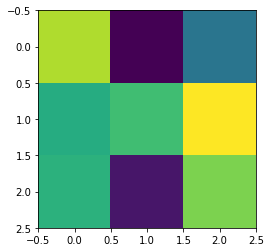

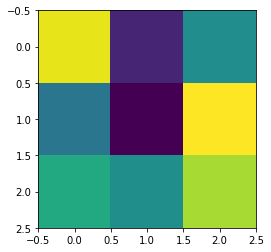

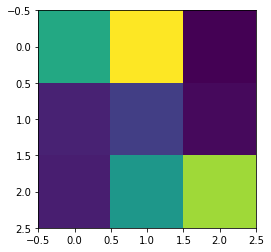

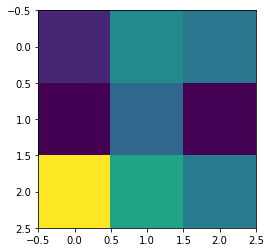

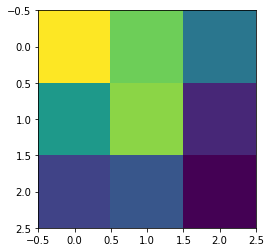

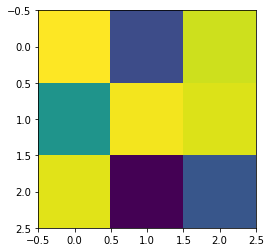

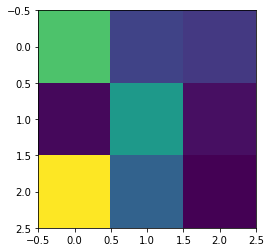

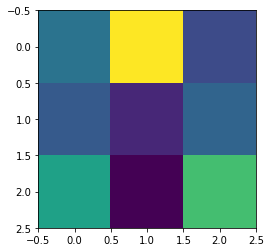

In [185]:
for filter_id in range(weights1.shape[-1]):
    new_weight = weights1[:,:,:,filter_id].reshape(3,3)
    weightList1.append(new_weight)
    plt.imshow(new_weight)
    plt.show()

In [186]:
imCopy = image

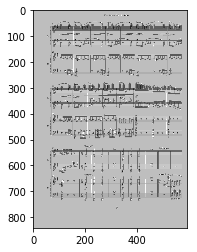

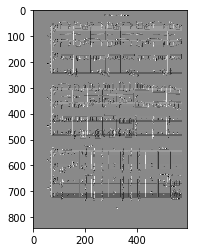

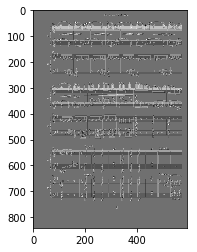

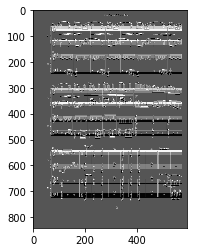

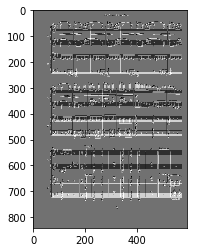

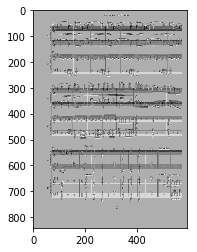

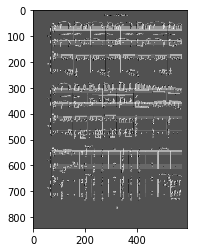

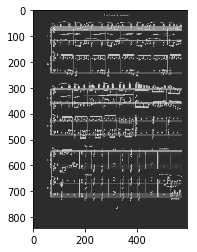

In [187]:
for i in range(len(weightList1)):
    temp = 0
    temp = convolve2d(imCopy, weightList1[i], mode="same")
    plt.imshow(temp, cmap='gray')
    plt.show()

In [188]:
layerTwoWeights = getModel_convcommon2().layers[2].get_weights()

In [189]:
weights2 = layerTwoWeights[0]

In [190]:
weights2.shape

(3, 3, 8, 8)

In [191]:
weights2 = weights2.reshape(3,3,1,64)

In [192]:
weightList2 = []

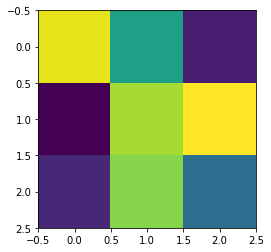

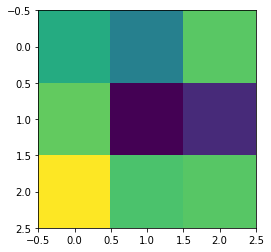

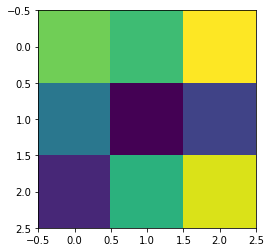

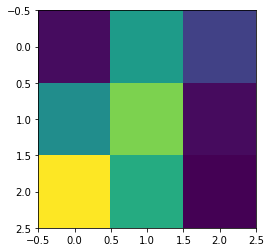

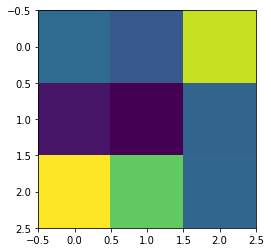

...

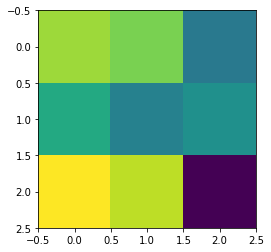

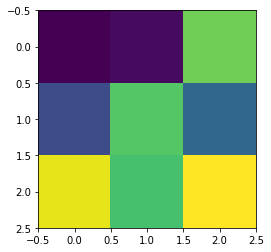

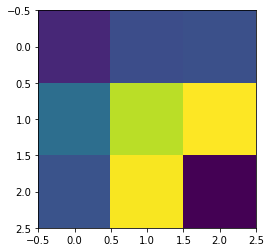

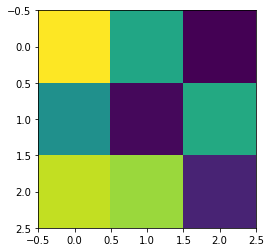

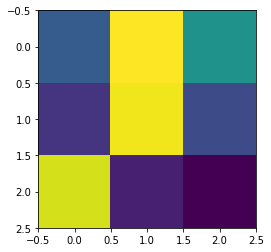

In [193]:
for filter_id in range(weights2.shape[-1]):
    new_weight = weights2[:,:,:,filter_id].reshape(3,3)
    weightList2.append(new_weight)
    plt.imshow(new_weight)
    plt.show()

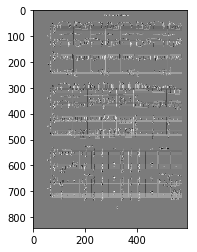

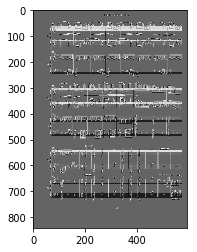

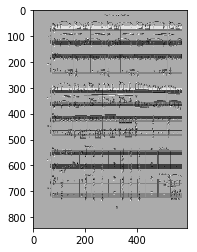

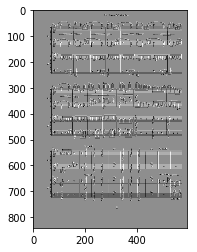

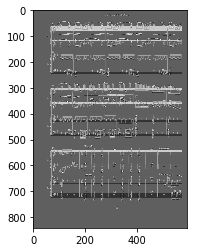

...

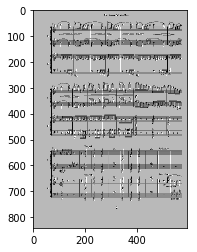

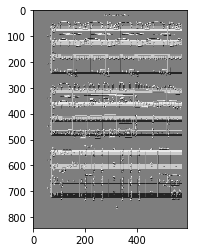

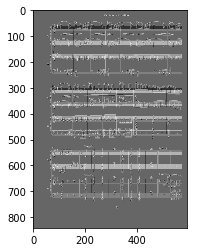

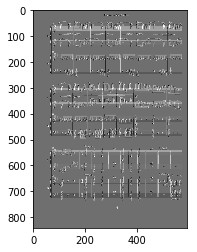

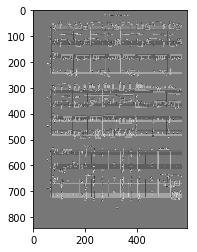

In [194]:
for i in range(len(weightList2)):
    temp = 0
    temp = convolve2d(imCopy, weightList2[i], mode="same")
    plt.imshow(temp, cmap='gray')
    plt.show()

In [195]:
layerThreeWeights = getModel_convcommon2().layers[4].get_weights()

In [196]:
weights3 = layerThreeWeights[0]

In [197]:
weights3.shape

(1, 1, 8, 8)

In [198]:
weights3 = weights3.reshape(1,1,1,64)

In [207]:
weightList3 = []

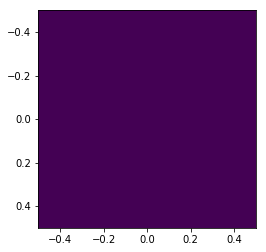

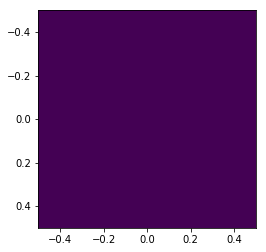

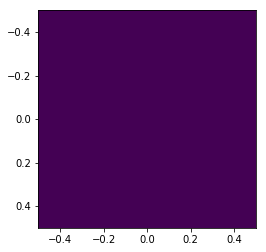

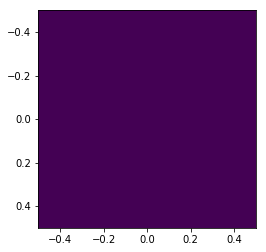

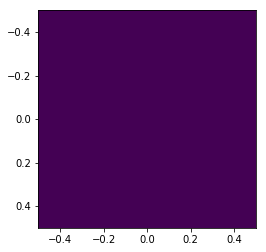

...

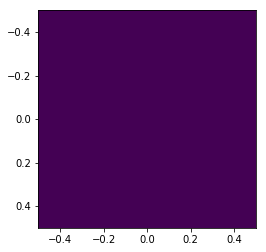

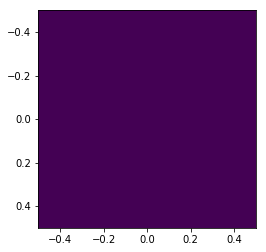

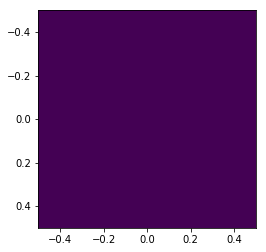

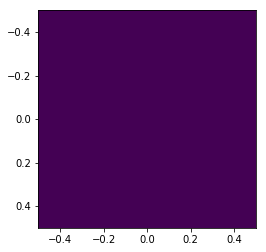

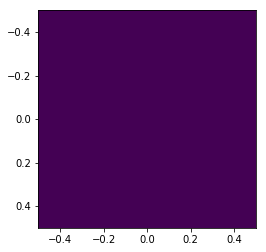

In [209]:
for filter_id in range(weights3.shape[-1]):
    new_weight = weights3[:,:,:,filter_id].reshape(1,1)
    weightList3.append(new_weight)
    plt.imshow(new_weight)
    plt.show()

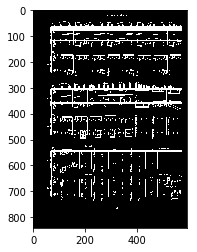

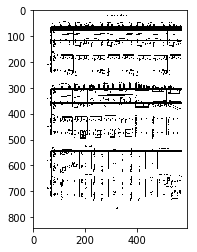

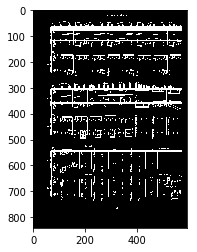

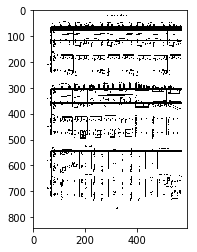

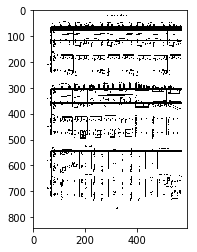

...

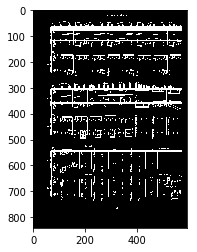

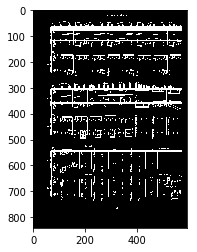

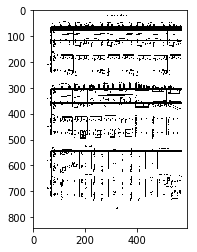

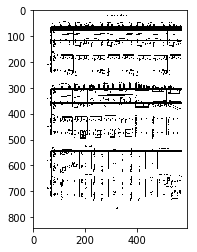

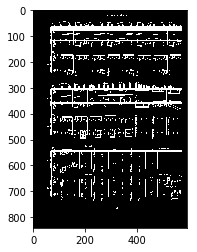

In [210]:
for i in range(len(weightList3)):
    temp = 0
    temp = convolve2d(imCopy, weightList3[i], mode="same")
    plt.imshow(temp, cmap='gray')
    plt.show()

In [202]:
layerFourWeights = getModel_convcommon2().layers[5].get_weights()

In [203]:
weights4 = layerFourWeights[0]

In [204]:
weights4.shape

(1, 1, 8, 8)

In [205]:
weights4 = weights4.reshape(1,1,1,64)

In [206]:
weightList4 = []

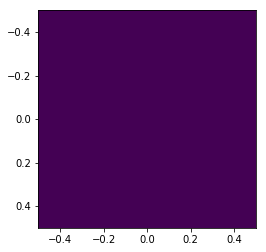

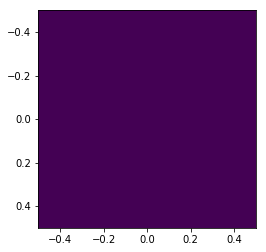

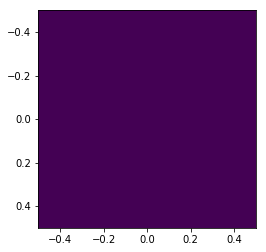

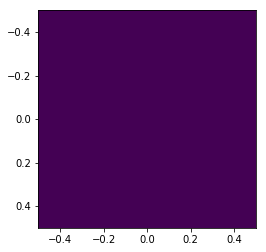

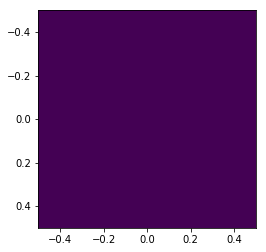

...

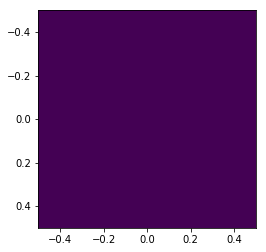

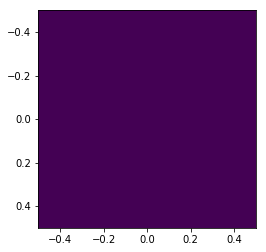

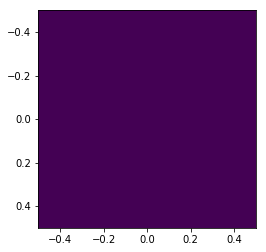

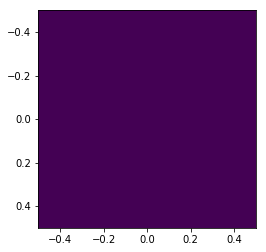

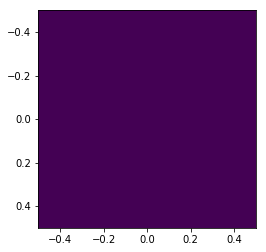

In [215]:
for filter_id in range(weights4.shape[-1]):
    new_weight = weights4[:,:,:,filter_id].reshape(1,1)
    weightList4.append(new_weight)
    plt.imshow(new_weight)
    plt.show()

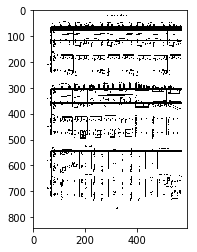

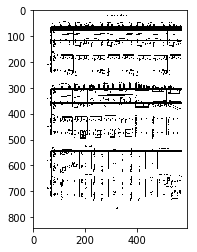

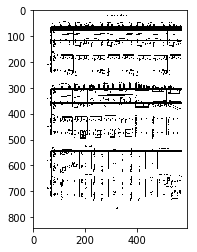

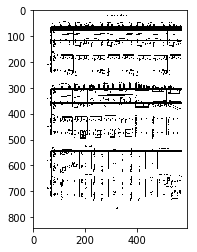

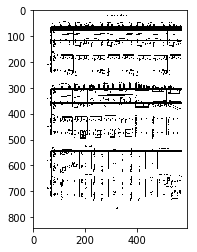

...

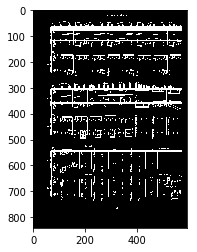

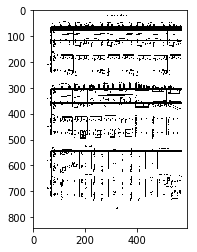

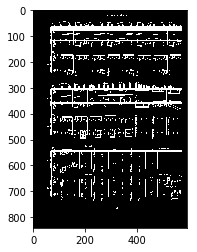

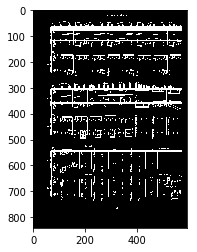

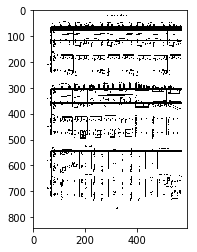

In [216]:
for i in range(len(weightList4)):
    temp = 0
    temp = convolve2d(imCopy, weightList4[i], mode="same")
    plt.imshow(temp, cmap='gray')
    plt.show()

In [217]:
lastLayerWeights = getModel_convcommon2().layers[8].get_weights()

In [218]:
weights6 = lastLayerWeights[0]

In [219]:
weights6.shape

(1, 1, 8, 8)

In [220]:
weights6 = weights6.reshape(1,1,1,64)

In [221]:
weightList6 = []

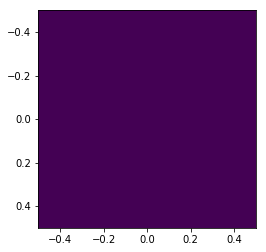

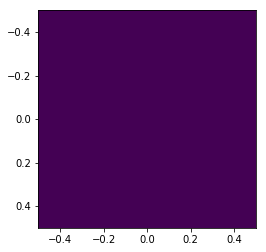

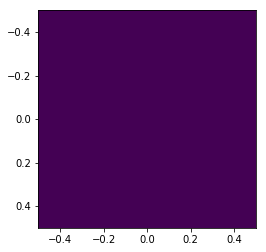

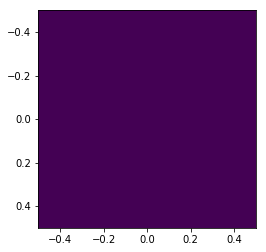

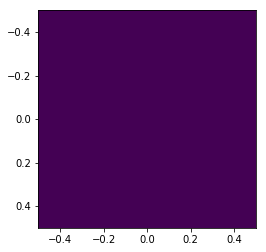

...

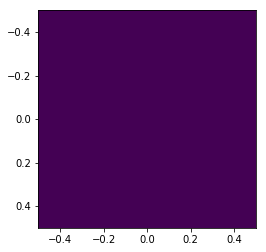

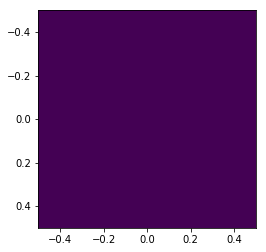

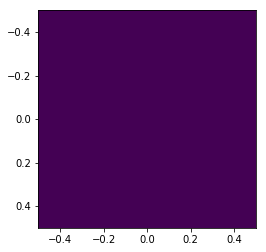

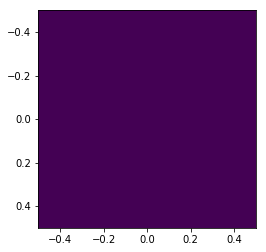

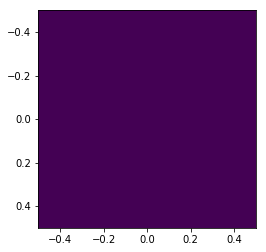

In [222]:
for filter_id in range(weights6.shape[-1]):
    new_weight = weights6[:,:,:,filter_id].reshape(1,1)
    weightList6.append(new_weight)
    plt.imshow(new_weight)
    plt.show()

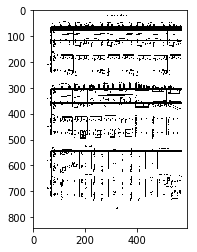

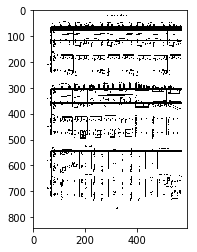

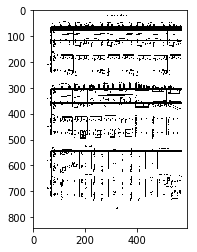

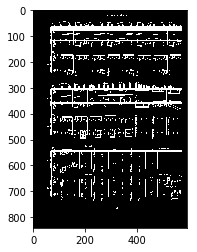

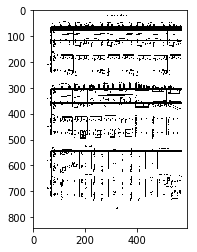

...

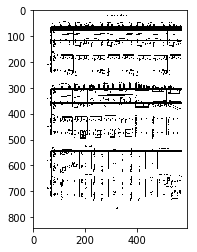

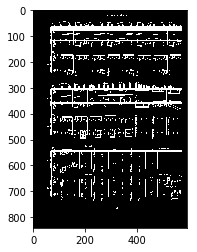

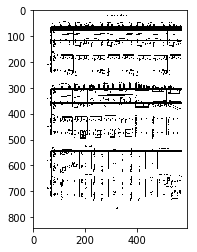

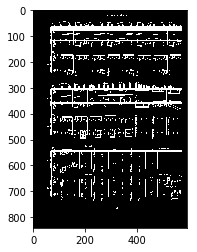

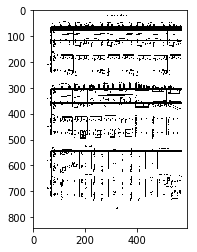

In [223]:
for i in range(len(weightList6)):
    temp = 0
    temp = convolve2d(imCopy, weightList6[i], mode="same")
    plt.imshow(temp, cmap='gray')
    plt.show()